SEGMENTAÇÃO DE CLIENTES FOOD DELIVERY

In [1]:
#importando os pacotes

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as m
import matplotlib.pyplot as plt
import sklearn 
import time
#ML
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

#formatação dos gráficos
plt.style.use('ggplot')
plt.figure(1, figsize=(10,8))
%matplotlib inline 

Carregando e compreendendo os dados

In [2]:
#carrega o dataset
food_delivery = pd.read_csv('C:/Users/est.diegosv/OneDrive - Votorantim/Diego/DSA/BusinessAnalytics/Cap4/dados/dataset.csv', encoding='utf-8')

In [3]:
food_delivery.head()

,id_transacao,horario_pedido,localidade,nome_item,quantidade_item,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,bebida,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,sobremesa,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salada,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,sobremesa,1,41.884490,-87.627059


In [4]:
food_delivery.shape

(260645, 7)

Análise exploratória.

In [5]:
food_delivery.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260645 entries, 0 to 260644
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id_transacao     260645 non-null  object 
 1   horario_pedido   260645 non-null  object 
 2   localidade       260645 non-null  int64  
 3   nome_item        260645 non-null  object 
 4   quantidade_item  260645 non-null  int64  
 5   latitude         260645 non-null  float64
 6   longitude        260645 non-null  float64
dtypes: float64(2), int64(2), object(3)
memory usage: 13.9+ MB


Podemos ver que não há valores missing no dataset

In [6]:
#verificando total de valores unicos por coluna
food_delivery.nunique()

id_transacao       100000
horario_pedido      76799
localidade              9
nome_item               4
quantidade_item         5
latitude                9
longitude               9
dtype: int64

In [7]:
#resumo estatistico das colunas numericas
food_delivery.describe()

,localidade,quantidade_item,latitude,longitude
count,260645.000000,260645.000000,260645.000000,260645.000000
mean,5.134904,2.447010,41.836095,-87.733930
std,2.551846,1.330863,0.144459,0.136369
min,1.000000,1.000000,41.524598,-88.010140
25%,3.000000,1.000000,41.784576,-87.849468
50%,5.000000,2.000000,41.881818,-87.677606
75%,7.000000,4.000000,41.889047,-87.627059
max,9.000000,5.000000,42.049306,-87.607565


Vamos criar uma tabela que fornecerá a quantidade de vezes que um item foi solicitado em um pedido

In [8]:
#lista para receber o total de pedidos
total_pedidos = []

Loop para criar a tabela PIVOT totalizando os itens por transação

In [9]:
#extraímos cada id e ccada grupo do 'group by' por id_transação
for k, group in food_delivery.groupby('id_transacao'):
    #extraimos cada id e cada grupo do group by po horario_pedido
    for m, n in group.groupby('horario_pedido'):
        
        #extraimos cada item de cada grupo
        id_transacao = k
        horario_pedido = m
        localidade = n['localidade'].values.tolist()[0]
        bebida = 0
        pizza = 0
        sobremesa = 0
        salada = 0
        n = n.reset_index(drop = True)
        
        #entao contabilizamos os itens dos pedidos
        for i in range(len(n)):
            item = n.loc[i, 'nome_item']
            num = n.loc[i, 'quantidade_item']
            
            if item == 'bebida':
                bebida = bebida + num
            
            elif item == 'pizza':
                pizza = pizza + num
            
            elif item == 'salada':
                salada = salada + num
                
            elif item == 'sobremesa':
                sobremesa = sobremesa + num
                
        output = [id_transacao, horario_pedido, localidade, bebida, pizza, salada, sobremesa]
        total_pedidos.append(output)

In [10]:
#convertemos a lista para dataframe do pandas
df_item_pedidos = pd.DataFrame(total_pedidos)

In [11]:
#ajustando o nome das colunas
df_item_pedidos.columns = ['id_transacao', 
                           'horario_pedido', 
                           'localidade', 
                           'bebida', 
                           'pizza', 
                           'salada', 
                           'sobremesa']

In [12]:
df_item_pedidos.head()

,id_transacao,horario_pedido,localidade,bebida,pizza,salada,sobremesa
0,0x10000a,2019-01-29 00:48:00,9,0,1,0,1
1,0x100058,2019-05-05 00:08:00,6,0,2,0,2
2,0x1000c8,2019-01-28 19:24:00,9,4,4,1,5
3,0x10014c,2019-02-23 00:15:00,6,0,1,0,1
4,0x1001d8,2019-06-30 17:50:00,2,3,3,0,3


Uma simples mudança nos dados já nos oferece uma perspectiva diferente dos dados. Na prática, apenas criamos uma tabela pivot.

Podemos criar também a tabela pivot utilizando uma função. Veremos a seguir


In [13]:
df_item_pedidos.shape

(100000, 7)

In [14]:
#verificando valores unicos
df_item_pedidos.nunique()

id_transacao      100000
horario_pedido     76799
localidade             9
bebida                 6
pizza                  6
salada                 6
sobremesa              5
dtype: int64

In [15]:
#criando a tabela pivot com pivot_table
df_pivot = food_delivery.pivot_table(index=['id_transacao'], columns=['nome_item'], values = 'quantidade_item')

In [16]:
#substituimos possivei valores NA por 0 e transformamos o indice em coluna
df_pivot = df_pivot.fillna(0).reset_index()

In [17]:
df_pivot.head()

nome_item,id_transacao,bebida,pizza,salada,sobremesa
0,0x10000a,0.0,1.0,0.0,1.0
1,0x100058,0.0,2.0,0.0,2.0
2,0x1000c8,4.0,4.0,1.0,5.0
3,0x10014c,0.0,1.0,0.0,1.0
4,0x1001d8,3.0,3.0,0.0,3.0


In [18]:
df_pivot.nunique()

nome_item
id_transacao    100000
bebida               6
pizza                6
salada               6
sobremesa            5
dtype: int64

In [19]:
df_pivot.describe()

nome_item,bebida,pizza,salada,sobremesa
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.239590,1.857840,0.711370,2.569210
std,1.627886,1.588589,1.086524,1.332084
min,0.000000,0.000000,0.000000,1.000000
25%,0.000000,1.000000,0.000000,1.000000
50%,0.000000,1.000000,0.000000,2.000000
75%,3.000000,3.000000,1.000000,4.000000
max,5.000000,5.000000,5.000000,5.000000


In [20]:
#Nao podemos ter valores nulos
df_pivot.isnull().sum()

nome_item
id_transacao    0
bebida          0
pizza           0
salada          0
sobremesa       0
dtype: int64

In [21]:
#Vamos incluir a coluna localidade. Fazemos o merge com a coluna id_transcao
df_pivot2 = df_pivot.merge(food_delivery[['id_transacao', 'localidade']])

In [22]:
df_pivot2.head()

,id_transacao,bebida,pizza,salada,sobremesa,localidade
0,0x10000a,0.0,1.0,0.0,1.0,9
1,0x10000a,0.0,1.0,0.0,1.0,9
2,0x100058,0.0,2.0,0.0,2.0,6
3,0x100058,0.0,2.0,0.0,2.0,6
4,0x1000c8,4.0,4.0,1.0,5.0,9


In [23]:
df_pivot2.nunique()

id_transacao    100000
bebida               6
pizza                6
salada               6
sobremesa            5
localidade           9
dtype: int64

*EXTRAINDO GRANULARIDADE DE TEMPO*

Em algum momento pode ser interessante fazer a segmentação por mês, por exemplo. Vamos extraí-lo e colocar em uma coluna separada

In [24]:
df_item_pedidos['mes'] = df_item_pedidos['horario_pedido'].apply(lambda x: time.strftime("%m", time.strptime(x, "%Y-%m-%d %H:%M:%S")))

In [25]:
df_item_pedidos.head()

,id_transacao,horario_pedido,localidade,bebida,pizza,salada,sobremesa,mes
0,0x10000a,2019-01-29 00:48:00,9,0,1,0,1,01
1,0x100058,2019-05-05 00:08:00,6,0,2,0,2,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,1,5,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,0,1,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,0,3,06


*AJUSTAR OS ÍNDICES*

Para segmentar os pedidos dos clientes, precisamos de uma coluna de identificação de cada registro. Não podemos usar a id_transacao, ja que essa coluna representa um dado válido e nao é um valor unico, logo nao pode ser usada para indice.

Vamos então criar uma coluna usando o indice atual.

In [26]:
#fazemos o reset do index e gravamos o resultado em outro dataframe
df_item_pedidos_idx = df_item_pedidos.reset_index()

In [27]:
df_item_pedidos_idx

,index,id_transacao,horario_pedido,localidade,bebida,pizza,salada,sobremesa,mes
0,0,0x10000a,2019-01-29 00:48:00,9,0,1,0,1,01
1,1,0x100058,2019-05-05 00:08:00,6,0,2,0,2,05
2,2,0x1000c8,2019-01-28 19:24:00,9,4,4,1,5,01
3,3,0x10014c,2019-02-23 00:15:00,6,0,1,0,1,02
4,4,0x1001d8,2019-06-30 17:50:00,2,3,3,0,3,06
...,...,...,...,...,...,...,...,...,...
99995,99995,0xffe96,2019-01-05 19:28:00,4,4,4,0,4,01
99996,99996,0xffeed,2019-08-08 00:42:00,2,0,1,0,1,08
99997,99997,0xfff07,2019-05-04 00:48:00,2,1,1,0,1,05
99998,99998,0xfff4d,2019-07-18 00:17:00,3,0,2,0,2,07


In [28]:
df_item_pedidos

,id_transacao,horario_pedido,localidade,bebida,pizza,salada,sobremesa,mes
0,0x10000a,2019-01-29 00:48:00,9,0,1,0,1,01
1,0x100058,2019-05-05 00:08:00,6,0,2,0,2,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,1,5,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,0,1,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,0,3,06
...,...,...,...,...,...,...,...,...
99995,0xffe96,2019-01-05 19:28:00,4,4,4,0,4,01
99996,0xffeed,2019-08-08 00:42:00,2,0,1,0,1,08
99997,0xfff07,2019-05-04 00:48:00,2,1,1,0,1,05
99998,0xfff4d,2019-07-18 00:17:00,3,0,2,0,2,07


*ANÁLISE DESCRITIVA*

Distplot dos atributos usados para a segmentação

c:\Users\est.diegosv\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\Users\est.diegosv\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\Users\est.diegosv\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `hist

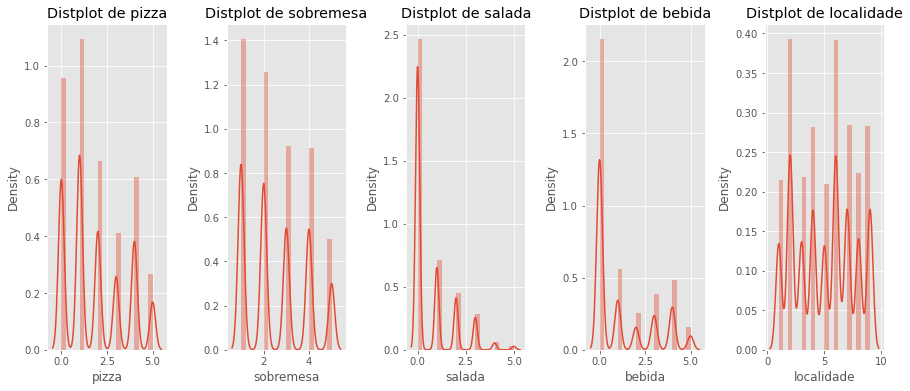

In [29]:
plt.figure(1, figsize=(15,6))
#inicializa o contador
n = 0

# loop pelas colunas
for x in ['pizza','sobremesa','salada','bebida','localidade']:
    n += 1
    plt.subplot(1, 5, n)
    plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
    sns.distplot(df_item_pedidos[x], bins = 20)
    plt.title('Distplot de {}'.format(x))
plt.show();

Gráfico de pedidos por localidade

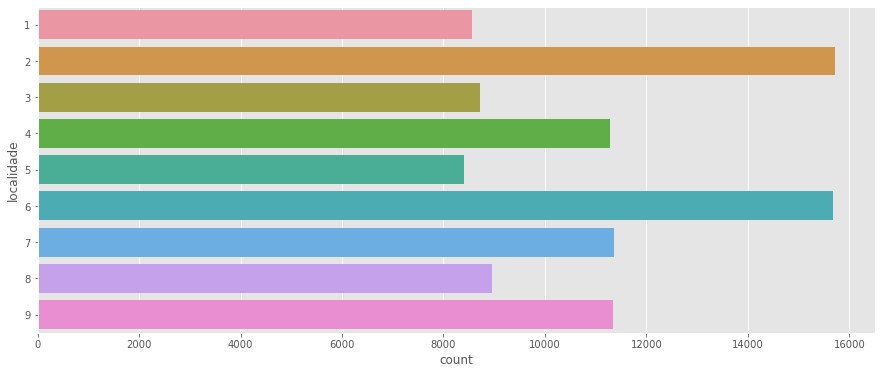

In [30]:
plt.figure(1, figsize=(15,6))
sns.countplot(y = 'localidade', data = df_item_pedidos)
plt.show()

Regplot dos atributos

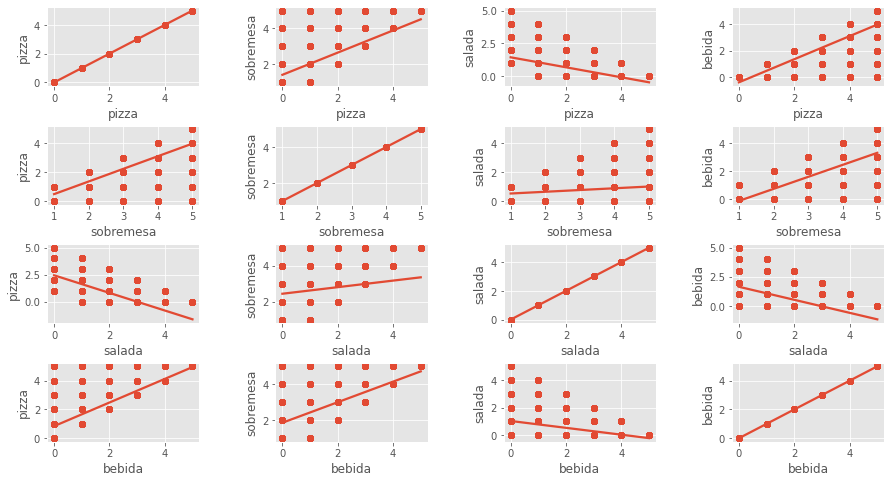

In [31]:
#Relação entre atributos
#tamanho da figura
plt.figure(1, figsize=(15,8))

#iniciliza o contador
n = 0

#loop pelos atributos
for x in ['pizza','sobremesa','salada','bebida']:
    for y in ['pizza','sobremesa','salada','bebida']:
        n += 1
        plt.subplot(4, 4, n)
        plt.subplots_adjust(hspace= 0.5, wspace= 0.5)
        sns.regplot(x = x, y = y, data = df_item_pedidos)
        plt.ylabel(y)
plt.show()
    

*Definindo as Variáveis para segmentação*

Vamos remover id_transação, horario_pedido, localidade e mes para as primeiras atividades de clusterização

In [32]:
#Filtrando o dataframe por colunas
df_item_pedidos_idx[['index', 'bebida', 'pizza', 'sobremesa', 'salada']]

,index,bebida,pizza,sobremesa,salada
0,0,0,1,1,0
1,1,0,2,2,0
2,2,4,4,5,1
3,3,0,1,1,0
4,4,3,3,3,0
...,...,...,...,...,...
99995,99995,4,4,4,0
99996,99996,0,1,1,0
99997,99997,1,1,1,0
99998,99998,0,2,2,0


In [33]:
#vamos criar um novo dataframe com o slice anterior
df = df_item_pedidos_idx[['index', 'bebida', 'pizza', 'sobremesa', 'salada']]

In [34]:
df.head()

,index,bebida,pizza,sobremesa,salada
0,0,0,1,1,0
1,1,0,2,2,0
2,2,4,4,5,1
3,3,0,1,1,0
4,4,3,3,3,0


*Análise de Custer*

Segmentação 1


Usando 2 variáveis (pizza e sobremesa)

In [35]:
x1 = df[['pizza', 'sobremesa']].iloc[: , :].values

In [36]:
#lista do WCSS
wcss_x1 = []

Muitas vezes, os dados com os quais você trabalha têm várias dimensões, dificultando a visualização. Como consequência, o número ideal de clusters não é muito óbvio. Felizmente, temos uma maneira de determinar isso matematicamente.

Representamos graficamente a relação entre o número de clusters e a soma dos quadrados dentro do cluster (Within Cluster Sum of Squares - WCSS) e, em seguida, selecionamos o número de clusters nos quais a mudança no WCSS começa a se estabilizar (Método Elbow).

Encontrando o valor ideal de clusters

Vamos testar diferentes valores de K entre 2 e 10.

Para inicialização dos clusters, utilizaremos o k-means++ que oferece convergencia mais rapida para o resultado final.

In [37]:
#loop para testar os valores de K
for n in range(2,  11):
    modelo = (KMeans(n_clusters = n,
                     init = "k-means++",
                     n_init = 10,
                     max_iter = 300,
                     tol = 0.0001,
                     random_state = 111,
                     algorithm = 'elkan'))
    modelo.fit(x1)
    wcss_x1.append(modelo.inertia_)

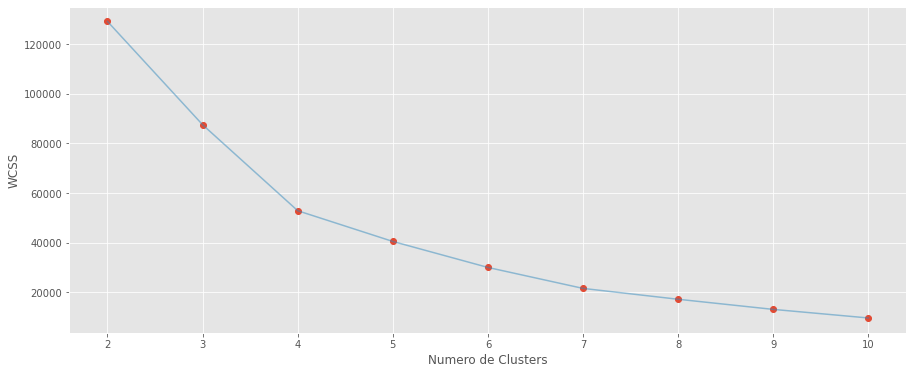

In [38]:
#plot
plt.figure(1, figsize=(15, 6))
plt.plot(np.arange(2,11), wcss_x1, 'o')
plt.plot(np.arange(2,11), wcss_x1, '-', alpha = 0.5)
plt.xlabel('Numero de Clusters'), plt.ylabel("WCSS")
plt.show()

Escolhemos o valor ideal de clusters e criamos o modelo final para a Segmentação 1. Observe no gráfico acima que não há certo ou errado. Poderíamos trabalhar com qualquer valor entre 2 e 10 (não faz sentido criar apenas 1 cluster).

O gráfico acima é chamado de Curva de Elbow e normalmente usamos o valor com o menor WCSS. Mas isso deve ser alinhado com as necessidade de negócio. Para esse exemplo, não faria sentido usar 10 clusters. Vamos começar com 2 clusters e avaliar e interpretar os resultados.

In [39]:
# Criação do modelo
modelo_seg1 = KMeans(n_clusters = 2, 
                     init = 'k-means++', 
                     n_init = 10, 
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan')

In [40]:
# Treinamento do modelo
modelo_seg1.fit(x1)

KMeans(algorithm='elkan', n_clusters=2, random_state=111)

In [41]:
# Extração dos labels
labels1 = modelo_seg1.labels_
labels1

array([0, 0, 1, ..., 0, 0, 0])

In [42]:
# Extração dos centróides
centroids1 = modelo_seg1.cluster_centers_
centroids1

array([[0.881644  , 1.82183485],
       [3.79958153, 4.05580631]])

*Visualização e interprettação da segmentação 1*

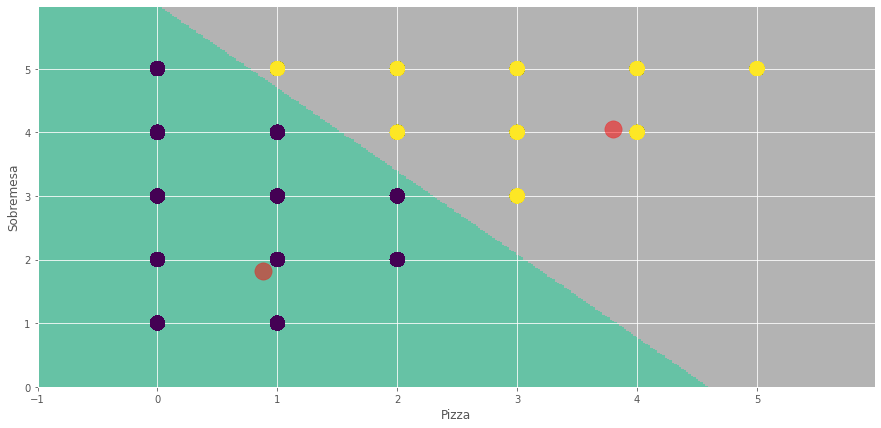

In [43]:
# Plot

# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = x1[:, 0].min() - 1, x1[:, 0].max() + 1
y_min, y_max = x1[:, 1].min() - 1, x1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg1.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Set2, 
           aspect = 'auto', 
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'sobremesa', data = df, c = labels1, s = 200 )
plt.scatter(x = centroids1[: , 0], y =  centroids1[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Sobremesa')
plt.show()

- O ponto vermelho é o centróide de cada cluster;

- No cluster 1 (verde) temos os clientes que pediram 0, 1 ou 2 pizzas. Em todos os casos houve pedido de sobremesa;

- No cluster 2 (cinza) estão os clientes que pediram 2, 3,4 ou 5 pizzas. Percebe-se que à medida que aumenta o número de pizzas no pedido, também aumenta o numero de sobremesas.


*Análise*:
- Cluster 1 - Clientes que pedem menos pizzas. Todos pedem sobremesa;
- Cluster 2 - Clientes que pedem mais pizzas. Todos pedem sobremesa em um volume maior.

Como estratégia de marketing, poderíamos oferecer ao cliente uma sobremesa gratuita no caso de comprar uma pizza de maior valor. Com base na segmentação essa estratégia provavelmente teria sucesso.

Vamos criar mais algumas segmentações:

- Segmentação 2 - Variáveis: Pizza e Salada;
- Segmentação 3 - Variáveis: Pizza e Bebida;
- Segmentação 4 - Variáveis: Pizza e Localidade;
- Segmentação 5 - Variáveis: Pizza, Bebida e Localidade;
- Segmentação 6 - Variáveis: Pizza, Salada, Bebida e Sobremesa.

### Segmentação 2

Segmentação 2 - Variáveis Pizza e Salada

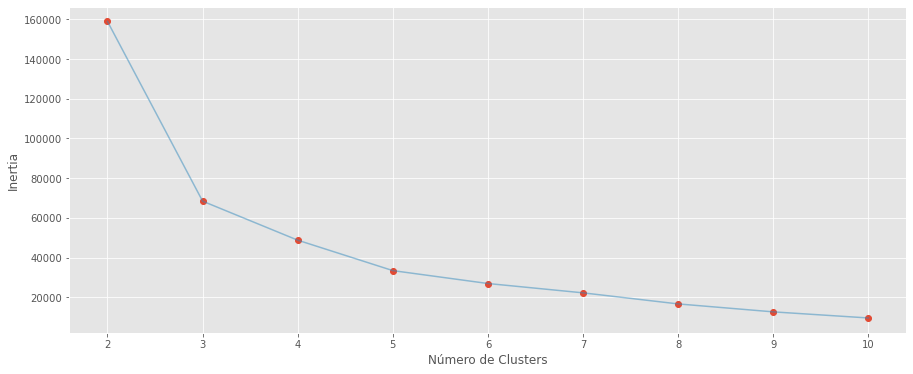

In [44]:
# Usaremos duas variáveis
X1 = df[['pizza' , 'salada']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 3 clusters.

In [45]:
# Criação do modelo com 3 clusters
modelo_seg2 = (KMeans(n_clusters = 3,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg2.fit(X1)

# Labels
labels2 = modelo_seg2.labels_

# Centróides
centroids2 = modelo_seg2.cluster_centers_

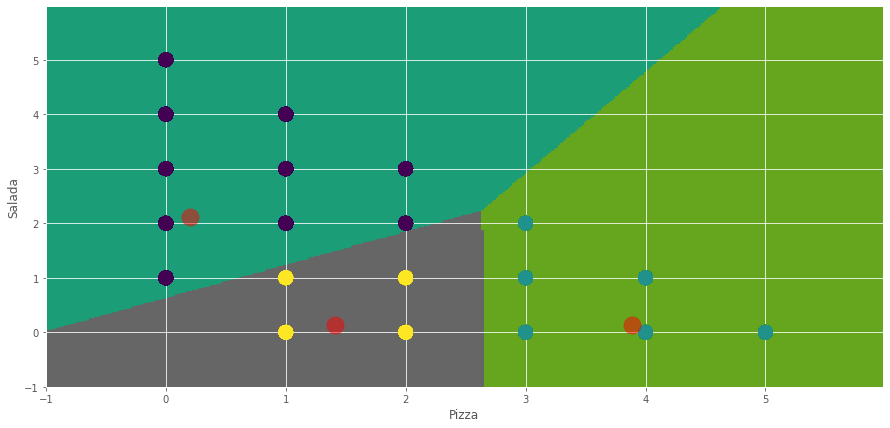

In [46]:
# Plot

# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg2.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Dark2, 
           aspect = 'auto', 
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'salada', data = df, c = labels2, s = 200 )
plt.scatter(x = centroids2[: , 0], y =  centroids2[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Salada')
plt.show()

- O ponto vermelho é o centróide de cada cluster;
- No cluster 1 (cinza) temos os clientes que pediram menos pizzas e mais saladas;
- No cluster 2 (verde escuro) temos os clientes que pediram poucas pizzas e poucas saladas;
- No cluster 3 (verde claro) estão os clientes que pediram mais pizzas e menos saladas.

*Análise:*
Os clusters 1 e 3 são de clientes com comportamentos opostos. A equipe de marketing poderia concentrar os esforços nos clientes do cluster 2, pois são  clientes que compram pizzas e saladas e, portanto, tendem a consumir itens mais variados evitando manter os estoques cheios de um único item.

Ou poderia concentrar os esforços nos clientes que consomem itens que geram mais lucro. Entretanto, seria preciso verificar qual item, pizza ou salada, é mais rentável.

### Segmentação 3

Segmentação 3 - Variáveis Pizza e Bebida

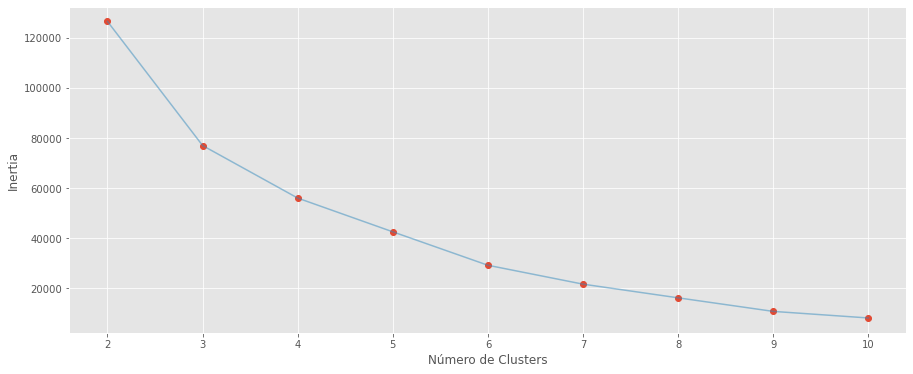

In [47]:
# Usaremos duas variáveis
X1 = df_item_pedidos_idx[['pizza' , 'bebida']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 3 clusters.

In [50]:
# Criação do modelo com 4 clusters
modelo_seg3 = (KMeans(n_clusters = 3,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg3.fit(X1)

# Labels
labels3 = modelo_seg3.labels_

# Centróides
centroids3 = modelo_seg3.cluster_centers_

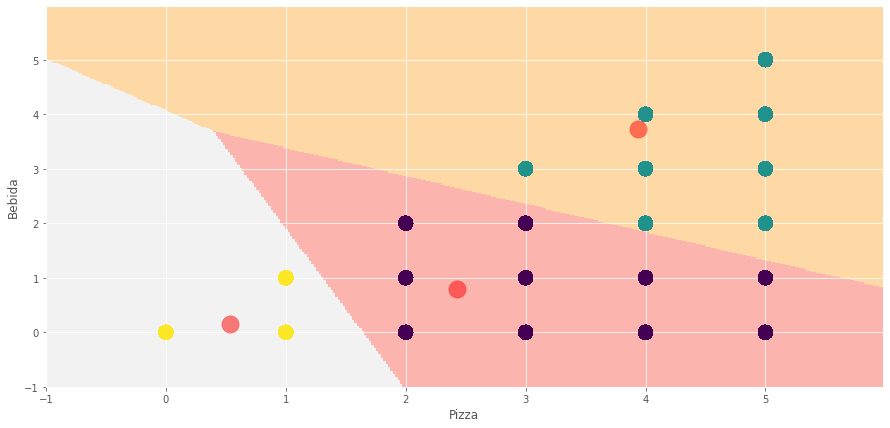

In [51]:
# Plot

# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg3.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel1, 
           aspect = 'auto', 
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'bebida', data = df_item_pedidos_idx, c = labels3, s = 200 )
plt.scatter(x = centroids3[: , 0], y =  centroids3[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Bebida')
plt.show()

*Análise:*
Observamos que clientes que pedem mais pizza também pedem mais bebida. Desta forma a equipe de marketing poderia ofertar algum desconto na bebida quando o cliente comprasse 2 ou mais pizzas.

### Segmentação 4

Segmentação 4 - Variáveis Pizza e Localidade

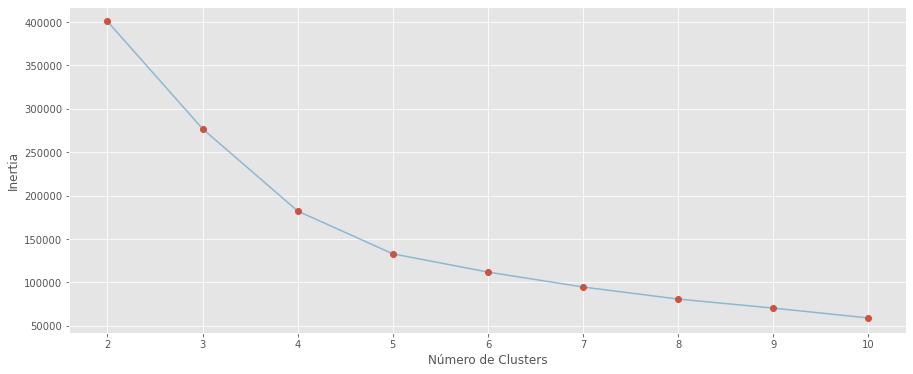

In [52]:
# Usaremos duas variáveis
X1 = df_item_pedidos_idx[['pizza' , 'localidade']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 4 clusters.

In [69]:
# Criação do modelo com 4 clusters
modelo_seg4 = (KMeans(n_clusters = 4,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg4.fit(X1)

# Labels
labels4 = modelo_seg4.labels_

# Centróides
centroids4 = modelo_seg4.cluster_centers_

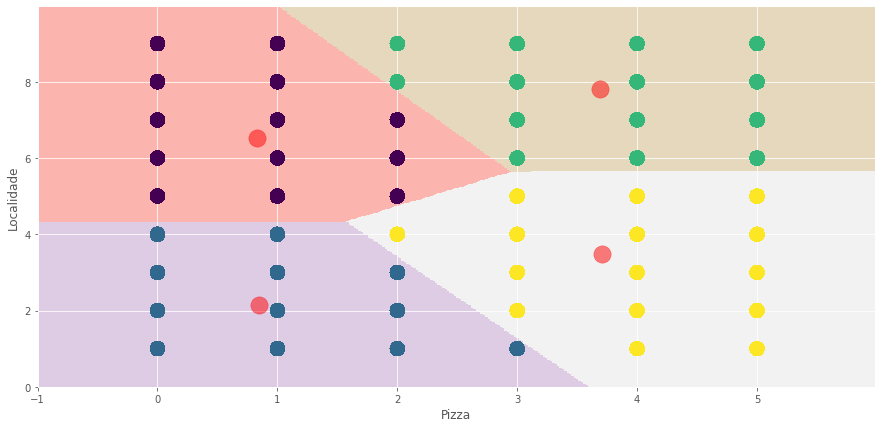

In [54]:
# Plot

# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg3.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel1, 
           aspect = 'auto', 
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'localidade', data = df_item_pedidos_idx, c = labels3, s = 200 )
plt.scatter(x = centroids3[: , 0], y =  centroids3[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Localidade')
plt.show()


- O ponto vermelho é o centróide de cada cluster (segmento).

- Observe que os clusters da esquerda no gráfico contém os pedidos de todas as Localidades, mas com menor número de Pizzas. Já os clusters da direita no gráfico contém pedidos de todas as Localidades com com maior número de Pizzas.

*Análise*:

Queremos aumentar as vendas, certo? Então teríamos que investigar mais a fundo os pedidos dos clusters à esquerda do gráfico e compreender em mais detalhes as características desses pedidos e que tipo de oferta podemos fazer.

### Segmentação 5

Segmentação 5 - Variáveis Pizza, Beebida e Localidade

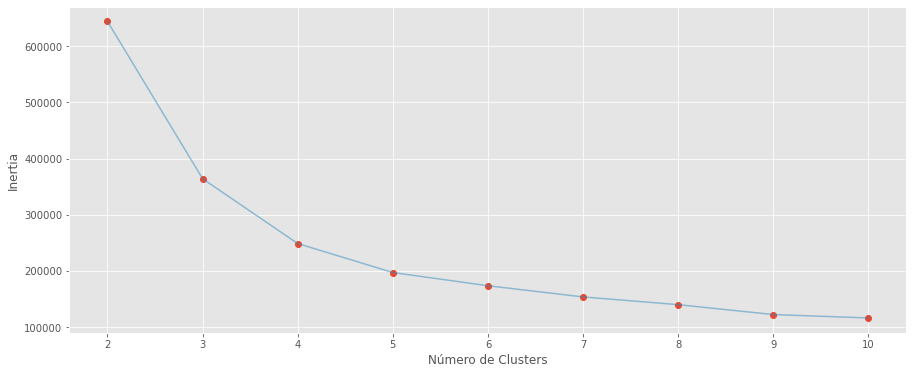

In [55]:
# Usaremos três variáveis
X1 = df_item_pedidos_idx[['pizza' , 'bebida' , 'localidade']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 4 clusters.

In [64]:
# Criação do modelo com 4 clusters
modelo_seg4 = (KMeans(n_clusters = 4,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg4.fit(X1)

# Labels
labels5 = modelo_seg4.labels_

# Centróides
centroids4 = modelo_seg4.cluster_centers_

O Meshgrid que criamos até aqui é útil para duas dimensões, mas com 3 dimensões precisamos de um gráfico mais apropriado. Vamos utilizar o Scatter3d.

In [57]:
# Pacotes para o gráfico 3D
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected = True)

In [65]:
# Plot

# Gráfico 3D
grafico = go.Scatter3d(x = df_item_pedidos_idx['pizza'], 
                       y = df_item_pedidos_idx['bebida'], 
                       z = df_item_pedidos_idx['localidade'], 
                       mode = 'markers', 
                       marker = dict(color = labels5, 
                                     size = 4,
                                     line = dict(color = labels5, width = 15),
                                     opacity = 0.7))

# Layout do gráfico
layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Bebida'),
                                zaxis = dict(title  = 'Localidade')))

# Plot da figura (gráfico + layout)
fig = go.Figure(data = grafico, layout = layout)
py.offline.iplot(fig)

- Observamos 2 clusters inferiores e 2 superiores.

- Cada ponto de dado representa uma coordenada de 3 dimensões.

*Análise*:

Aqui o ideal é avaliar o gráfico de forma interativa aproveitando essa propriedade do Plotly.

### Segmentação 6

Segmentação 6 - Variáveis Pizza, Salada e Sobremesa

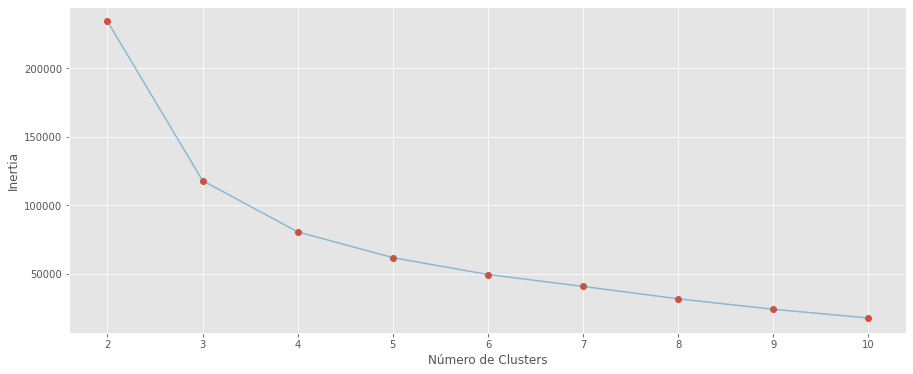

In [61]:
# Usaremos 4 variáveis
X1 = df_item_pedidos_idx[['pizza' , 'salada' , 'sobremesa']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++', 
                     n_init = 10,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111, 
                     algorithm = 'elkan'))
    modelo.fit(X1)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

Vamos criar o modelo com 3 clusters

In [66]:
# Criação do modelo com 3 clusters
modelo_seg6 = (KMeans(n_clusters = 3,
                      init = 'k-means++', 
                      n_init = 10 ,
                      max_iter = 300, 
                      tol = 0.0001,  
                      random_state = 111  , 
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg6.fit(X1)

# Labels
labels6 = modelo_seg6.labels_

# Centróides
centroids5 = modelo_seg6.cluster_centers_

In [67]:
# Plot

# Gráfico 3D
grafico = go.Scatter3d(x = df_item_pedidos_idx['pizza'], 
                       y = df_item_pedidos_idx['salada'], 
                       z = df_item_pedidos_idx['sobremesa'], 
                       mode = 'markers', 
                       marker = dict(color = labels6, 
                                     size = 4,
                                     line = dict(color = labels6, width = 15),
                                     opacity = 0.7))

# Layout do gráfico
layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salada'),
                                zaxis = dict(title  = 'Sobremesa')))

# Plot da figura (gráfico + layout)
fig = go.Figure(data = grafico, layout = layout)
py.offline.iplot(fig)


- Observamos a separação entre os dados dos 3 clusters.

- Cada ponto de dado representa uma coordenada de 3 dimensões.

*Análise*:

Aqui o ideal é avaliar o gráfico de forma interativa aproveitando essa propriedade do Plotly.

### *Relatório final*
Considerando a Segmentação 6

In [70]:
# Shape dos labels
labels6.shape

(100000,)

In [71]:
type(labels6)

numpy.ndarray

In [72]:
# Converte o array para dataframe
df_labels = pd.DataFrame(labels5)

In [73]:
# Visualiza
df_labels.head(5)

,0
0,3
1,0
2,1
3,3
4,0


In [74]:
# Vamos fazer o merge de df2 e os labels (clusters) encontrados pelo modelo
# Lembre-se que usamos somente 3 variáveis para criar a segmentação
df_final = df_item_pedidos_idx.merge(df_labels, left_index = True, right_index = True)

In [75]:
df_final

,index,id_transacao,horario_pedido,localidade,bebida,pizza,salada,sobremesa,mes,0
0,0,0x10000a,2019-01-29 00:48:00,9,0,1,0,1,01,3
1,1,0x100058,2019-05-05 00:08:00,6,0,2,0,2,05,0
2,2,0x1000c8,2019-01-28 19:24:00,9,4,4,1,5,01,1
3,3,0x10014c,2019-02-23 00:15:00,6,0,1,0,1,02,3
4,4,0x1001d8,2019-06-30 17:50:00,2,3,3,0,3,06,0
...,...,...,...,...,...,...,...,...,...,...
99995,99995,0xffe96,2019-01-05 19:28:00,4,4,4,0,4,01,1
99996,99996,0xffeed,2019-08-08 00:42:00,2,0,1,0,1,08,3
99997,99997,0xfff07,2019-05-04 00:48:00,2,1,1,0,1,05,3
99998,99998,0xfff4d,2019-07-18 00:17:00,3,0,2,0,2,07,0


In [76]:
# Ajusta o nome da coluna
df_final.rename(columns = {0:"cluster"}, inplace = True)

In [77]:
# Visualiza
df_final

,index,id_transacao,horario_pedido,localidade,bebida,pizza,salada,sobremesa,mes,cluster
0,0,0x10000a,2019-01-29 00:48:00,9,0,1,0,1,01,3
1,1,0x100058,2019-05-05 00:08:00,6,0,2,0,2,05,0
2,2,0x1000c8,2019-01-28 19:24:00,9,4,4,1,5,01,1
3,3,0x10014c,2019-02-23 00:15:00,6,0,1,0,1,02,3
4,4,0x1001d8,2019-06-30 17:50:00,2,3,3,0,3,06,0
...,...,...,...,...,...,...,...,...,...,...
99995,99995,0xffe96,2019-01-05 19:28:00,4,4,4,0,4,01,1
99996,99996,0xffeed,2019-08-08 00:42:00,2,0,1,0,1,08,3
99997,99997,0xfff07,2019-05-04 00:48:00,2,1,1,0,1,05,3
99998,99998,0xfff4d,2019-07-18 00:17:00,3,0,2,0,2,07,0
